https://www.tensorflow.org/datasets/catalog/overview
- Audio, Image, Object detection, Structured, Summarization, Text, Translate, Video 등등 다양한 범주를 가지고 있다
- Structured 데이터란 행과 열이 있는 2차원 형태의 표 데이터로, 다른 말로는 정형 데이터라고 하기도 한다. 

# 1. 준비

In [1]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


In [2]:
import tensorflow as tf
print(tf.__version__)

2.6.0


In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

- tensorflow_datasets는 텐서플로우가 제공하는 데이터셋 모음집입니다. 우리에게 필요한 강아지와 고양이 이미지뿐만 아니라 음성 데이터셋, 이미지 데이터셋, 텍스트 데이터셋 등 방대한 종류의 데이터셋을 제공하죠.

In [4]:
!mkdir -p ~/aiffel/cats_vs_dogs/PetImages
!ln -s ~/data/* ~/aiffel/cats_vs_dogs/

In [5]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/aiffel/cats_vs_dogs/',
    download=False,
    with_info=True,
    as_supervised=True,
)

In [6]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


- 모든 데이터셋은 (image, label)의 형태를 가집니다. 
- ((None, None, 3), ())가 이를 나타내죠. 여기에서 앞에 있는 (None, None, 3)은 image의 shape를, 뒤의 ()는 정답 카테고리인 label의 shape를 의미합니다.
- 이때 height와 width가 None으로 나타난 이유는 모든 이미지의 크기가 전부 다르기 때문입니다. 정해져 있지 않은 사이즈이기 때문에 None으로 나타낸 거죠.
- 3이라는 숫자는 이미지의 색을 표현하는 채널의 수를 나타냅니다. 컬러 이미지의 경우, 각 픽셀(pixel)의 색은 RGB의 세 가지 색의 조합으로 나타나기 때문에 컬러 이미지는 항상 3개의 채널을 가지고 있어야 하죠. 반면, 흑백 이미지는 white/black만 나타내면 되므로 단 하나의 채널만 있어도 충분합니다.


# 2. 데이터 가공

In [7]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


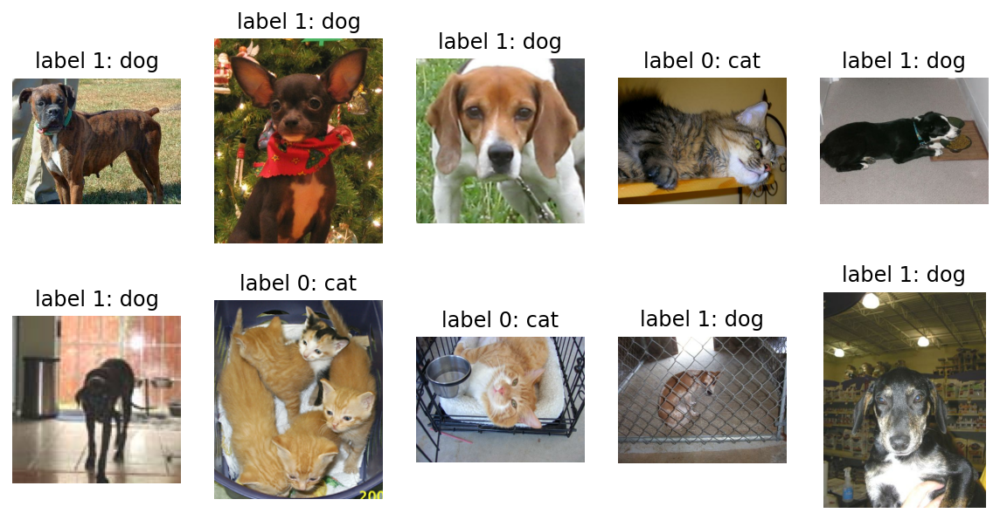

In [8]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

- 강아지는 1, 고양이는 0

In [9]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print("슝~")

슝~


- 타입캐스팅(Type Casting) : 다른 데이터 타입으로 형(타입)을 바꿔주는 것을 의미합니다. 여기서는 정수형을 실수형으로 바꾸기 위해 float()를 사용.
- 여기서는 0-255 사이의 값들을 그 중간값인 127.5로 나누고 1을 뺐으므로, -1 -1 사이의 실수값이 된다.

In [25]:
a = [1,2,3,4,5,6,7,8,9]
a = list(map(str, a))
a

['1', '2', '3', '4', '5', '6', '7', '8', '9']

- 리스트의 요소를 문자열로 변환하기

In [12]:
# 모든 이미지의 크기를 (160, 160, 3)으로 통일시켰습니다.

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


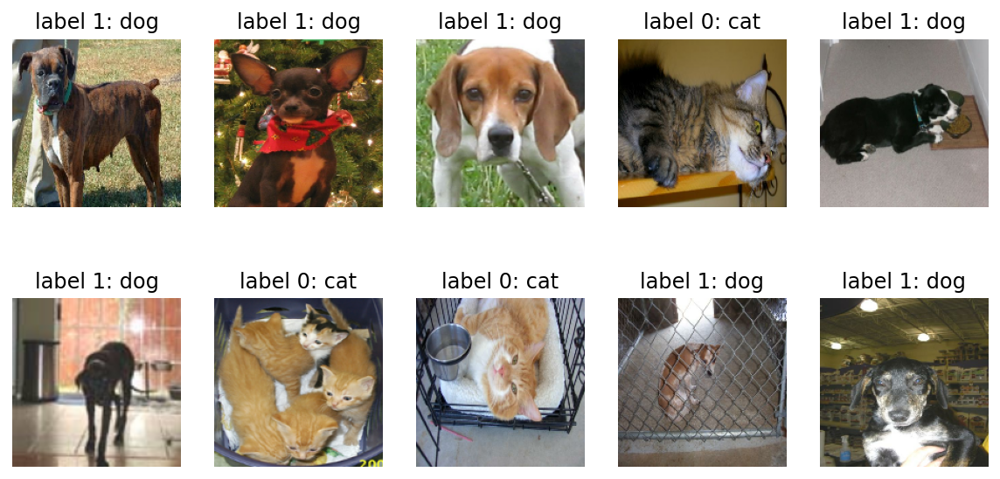

In [13]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# 3. 모델 만들기

In [14]:
# 모델생성에 필요한 함수

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print("슝~")

슝~


In [15]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

print("슝~")

슝~


-  filters = filter의 수 (이 값이 클수록 모델은 더 복잡한 특징을 학습할 수 있지만, 계산량이 증가하고 과적합(overfitting)의 위험이 있습니다)
- kernel_size = filter의 크기(3 대신 (3,3) 형태로 작성해도 같은 의미)
- padding = same은 입력과 출력의 사이즈를 동일하게 맞춥니다.
- activation = 사용할 활성화 함수

In [16]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

- 첫 번째 차원은 데이터의 개수를 나타냅니다. 여기서는 정해지지 않은 수라는 None 기호로 표시되었네요. None은 배치(batch) 사이즈에 따라 모델에 다른 수의 입력이 들어올 수 있음
- 데이터 하나의 크기는 (height, width, channel)로 3차원이죠. 6개의 레이어를 지나면서 height와 width는 점점 작아지고, channel은 점점 커지다가, flatten 계층을 만나 25,600(20x20x64)이라는 하나의 숫자로, 즉 1차원으로 shape가 줄어듭니다.

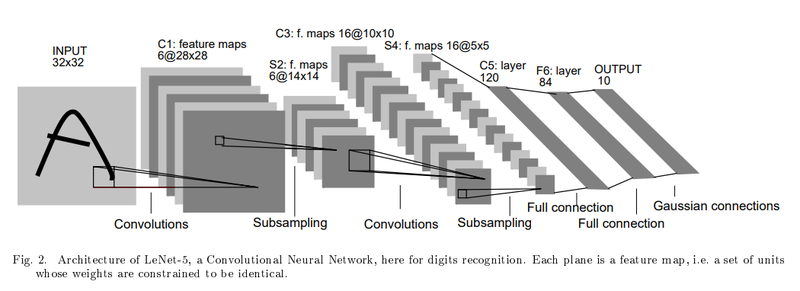
- 맨 왼쪽처럼 이미지 한 장이 입력되면 그 이미지는 Convolutional(합성곱) 연산을 통해 그 형태가 점점 길쭉해지다가, Flatten 레이어를 만나면 오른쪽처럼 한 줄로 펴집니다. 3차원의 이미지를 1차원 으로 펼치는 거죠.

In [17]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [18]:
image.flatten()

array([1, 2, 3, 4])

- flatten을 시키면 이렇게 일렬로 펼쳐진다
- 그 후 Dense 레이어에서 512개의 노드로 축소시켜 최종 출력은 단 두 개의 숫자로 구성된 하나의 확률분포를 내뱉게 되죠. 이 두 숫자는 각각 입력된 이미지가 강아지일 확률과 고양이인 확률을 의미하게 될 것입니다.
- 정리해 보자면, 딥러닝 모델은 (160, 160, 3) 크기의 3차원 이미지를 입력받아 여러 레이어를 거치며 형태를 바꾸다가 최종적으로는 몇 개의 숫자를 출력해내는 함수라고 할 수 있습니다.

# 4. 모델 컴파일 후 학습

In [19]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print("슝~")

슝~


* compile을 하기 위해서는 세 가지가 필요합니다. 바로 optimizer, loss, metrics 라는 친구들입니다.
    - optimizer는 학습을 어떤 방식으로 시킬 것인지 결정합니다. 어떻게 최적화시킬 것인지를 결정하기 때문에 최적화 함수라고 부르기도 합니다.
    - loss는 모델이 학습해나가야 하는 방향 을 결정합니다. 이 문제에서는 모델의 출력은 입력받은 이미지가 고양이인지 강아지인지에 대한 확률분포로 두었으므로, 입력 이미지가 고양이(label=0)일 경우 모델의 출력이 [1.0, 0.0]에 가깝도록, 강아지(label=1)일 경우 [0.0, 1.0]에 가까워지도록 하는 방향을 제시합니다.
    - metrics는 모델의 성능을 평가하는 척도 입니다. 분류 문제를 풀 때, 성능을 평가할 수 있는 지표는 정확도(accuracy), 정밀도(precision), 재현율(recall) 등이 있습니다. 여기서는 정확도를 사용했습니다.


In [20]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
print("슝~")

슝~


In [21]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print("슝~")

슝~


- BATCH_SIZE에 따라 32개의 데이터를 랜덤으로 뿌려줄 train_batches, validation_batches, test_batches를 만들어 주겠습니다. 
- train_batches는 모델이 끊임없이 학습될 수 있도록 전체 데이터에서 32개를 랜덤으로 뽑아 계속 제공해 줄 것입니다.
- Shuffle_buffer_size는 모델이 데이터를 섞을 때 한 번에 버퍼에 로드되는 데이터의 개수를 의미합니다. 이 값이 클수록 더 많은 데이터가 섞여 무작위성이 높아지지만, 메모리를 많이 소비하게 됩니다.

In [22]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

- 이렇게 train_batches에서 하나의 batch만 꺼내 데이터를 확인해보면, shape가 [32, 160, 160, 3] 으로 데이터 갯수가 32개임을 알 수 있다

> 학습 전 초기 검증 (validation)으로 20번 예측하고, 평균 loss와 accuracy 확인

In [23]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 9/20 [============>.................] - ETA: 0s - loss: 0.6833 - accuracy: 0.5556

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


20/20 [==============================] - 23s 60ms/step - loss: 0.6913 - accuracy: 0.5297
initial loss: 0.69
initial accuracy: 0.53


Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


- loss는 말 그대로 "손실"이라는 뜻으로, 얼마나 모델이 틀렸는지 나타냅니다. 따라서 loss는 낮을수록 좋은 것이죠. 
- accuracy는 몇 퍼센트의 정확도를 보이느냐 에 대한 수치입니다.

In [24]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
168/582 [=======>......................] - ETA: 33s - loss: 0.6671 - accuracy: 0.6034

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 30s - loss: 0.6605 - accuracy: 0.6099

211/582 [=========>....................] - ETA: 29s - loss: 0.6582 - accuracy: 0.6129

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 23s - loss: 0.6448 - accuracy: 0.6266

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


489/582 [========================>.....] - ETA: 7s - loss: 0.6103 - accuracy: 0.6594

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.6074 - accuracy: 0.6619

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 5s - loss: 0.6067 - accuracy: 0.6627

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 3s - loss: 0.6031 - accuracy: 0.6662

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.6019 - accuracy: 0.6670

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.5983 - accuracy: 0.6704

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 57s 88ms/step - loss: 0.5983 - accuracy: 0.6704 - val_loss: 0.5253 - val_accuracy: 0.7455
Epoch 2/10
166/582 [=======>......................] - ETA: 36s - loss: 0.5168 - accuracy: 0.7430

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 33s - loss: 0.5162 - accuracy: 0.7434

209/582 [=========>....................] - ETA: 32s - loss: 0.5146 - accuracy: 0.7443

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 26s - loss: 0.5100 - accuracy: 0.7490

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


489/582 [========================>.....] - ETA: 8s - loss: 0.4966 - accuracy: 0.7575

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 6s - loss: 0.4969 - accuracy: 0.7573

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 6s - loss: 0.4966 - accuracy: 0.7579 ETA: 6s - loss: 0.4963 - accuracy: 0.75

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.4938 - accuracy: 0.7598

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 2s - loss: 0.4936 - accuracy: 0.7598

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.4925 - accuracy: 0.7604

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 52s 86ms/step - loss: 0.4925 - accuracy: 0.7604 - val_loss: 0.5279 - val_accuracy: 0.7377
Epoch 3/10
169/582 [=======>......................] - ETA: 17s - loss: 0.4604 - accuracy: 0.7870

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 15s - loss: 0.4538 - accuracy: 0.7912

212/582 [=========>....................] - ETA: 15s - loss: 0.4538 - accuracy: 0.7907

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.4504 - accuracy: 0.7902

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4386 - accuracy: 0.7967

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4389 - accuracy: 0.7966

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.4382 - accuracy: 0.7970

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4357 - accuracy: 0.7990

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4350 - accuracy: 0.7995

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4342 - accuracy: 0.8004

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.4342 - accuracy: 0.8004 - val_loss: 0.5271 - val_accuracy: 0.7395
Epoch 4/10
168/582 [=======>......................] - ETA: 32s - loss: 0.4048 - accuracy: 0.8162

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.4028 - accuracy: 0.8192

210/582 [=========>....................] - ETA: 29s - loss: 0.4035 - accuracy: 0.8189

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 23s - loss: 0.3993 - accuracy: 0.8194

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 7s - loss: 0.3887 - accuracy: 0.8241

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.3888 - accuracy: 0.8239

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.3880 - accuracy: 0.8241

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.3868 - accuracy: 0.8248

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.3862 - accuracy: 0.8254

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3848 - accuracy: 0.8259

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 50s 83ms/step - loss: 0.3847 - accuracy: 0.8258 - val_loss: 0.5171 - val_accuracy: 0.7537
Epoch 5/10
168/582 [=======>......................] - ETA: 33s - loss: 0.3621 - accuracy: 0.8408

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.3601 - accuracy: 0.8430

210/582 [=========>....................] - ETA: 29s - loss: 0.3619 - accuracy: 0.8420

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 23s - loss: 0.3544 - accuracy: 0.8472

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 7s - loss: 0.3437 - accuracy: 0.8502

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 6s - loss: 0.3430 - accuracy: 0.8503

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.3432 - accuracy: 0.8503 ETA: 5s - loss: 0.3432 - accuracy: 

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.3425 - accuracy: 0.8505

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 2s - loss: 0.3417 - accuracy: 0.8508

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3398 - accuracy: 0.8518

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 51s 83ms/step - loss: 0.3397 - accuracy: 0.8518 - val_loss: 0.5789 - val_accuracy: 0.7442
Epoch 6/10
168/582 [=======>......................] - ETA: 34s - loss: 0.3107 - accuracy: 0.8657

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.3119 - accuracy: 0.8637

210/582 [=========>....................] - ETA: 30s - loss: 0.3130 - accuracy: 0.8635

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.3085 - accuracy: 0.8670

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 7s - loss: 0.3002 - accuracy: 0.8721

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.2998 - accuracy: 0.8723

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.2998 - accuracy: 0.8723

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.2980 - accuracy: 0.8734

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.2977 - accuracy: 0.8733

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2969 - accuracy: 0.8735

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 53s 87ms/step - loss: 0.2969 - accuracy: 0.8736 - val_loss: 0.5002 - val_accuracy: 0.7803
Epoch 7/10
168/582 [=======>......................] - ETA: 32s - loss: 0.2746 - accuracy: 0.8834

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.2733 - accuracy: 0.8848

211/582 [=========>....................] - ETA: 29s - loss: 0.2736 - accuracy: 0.8848

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 23s - loss: 0.2684 - accuracy: 0.8894

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.2589 - accuracy: 0.8945

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.2595 - accuracy: 0.8944

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 5s - loss: 0.2590 - accuracy: 0.8949

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 3s - loss: 0.2570 - accuracy: 0.8957

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.2566 - accuracy: 0.8959

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2563 - accuracy: 0.8956

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 51s 85ms/step - loss: 0.2563 - accuracy: 0.8956 - val_loss: 0.4980 - val_accuracy: 0.7902
Epoch 8/10
168/582 [=======>......................] - ETA: 33s - loss: 0.2353 - accuracy: 0.9036

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.2366 - accuracy: 0.9033- ETA: 31s - loss: 0.2356 - accura

210/582 [=========>....................] - ETA: 30s - loss: 0.2360 - accuracy: 0.9036

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.2312 - accuracy: 0.9078

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.2218 - accuracy: 0.9122

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 6s - loss: 0.2211 - accuracy: 0.9123

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.2211 - accuracy: 0.9124

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.2191 - accuracy: 0.9131

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 2s - loss: 0.2182 - accuracy: 0.9135

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.2173 - accuracy: 0.9139

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 52s 85ms/step - loss: 0.2173 - accuracy: 0.9139 - val_loss: 0.4718 - val_accuracy: 0.8074
Epoch 9/10
167/582 [=======>......................] - ETA: 33s - loss: 0.1928 - accuracy: 0.9263

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.1942 - accuracy: 0.9245

211/582 [=========>....................] - ETA: 29s - loss: 0.1941 - accuracy: 0.9258

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 23s - loss: 0.1887 - accuracy: 0.9275

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 7s - loss: 0.1830 - accuracy: 0.9299

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 6s - loss: 0.1832 - accuracy: 0.9297

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1821 - accuracy: 0.9304

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


542/582 [==========================>...] - ETA: 3s - loss: 0.1804 - accuracy: 0.9315

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1800 - accuracy: 0.9318

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1791 - accuracy: 0.9322

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 51s 84ms/step - loss: 0.1791 - accuracy: 0.9322 - val_loss: 0.4962 - val_accuracy: 0.8027
Epoch 10/10
168/582 [=======>......................] - ETA: 32s - loss: 0.1493 - accuracy: 0.9455

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.1543 - accuracy: 0.9431

211/582 [=========>....................] - ETA: 29s - loss: 0.1540 - accuracy: 0.9439

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 23s - loss: 0.1515 - accuracy: 0.9440

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 7s - loss: 0.1443 - accuracy: 0.9475

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1438 - accuracy: 0.9476

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1430 - accuracy: 0.9481

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


542/582 [==========================>...] - ETA: 3s - loss: 0.1424 - accuracy: 0.9478

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 2s - loss: 0.1418 - accuracy: 0.9482

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1411 - accuracy: 0.9486

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 51s 83ms/step - loss: 0.1411 - accuracy: 0.9486 - val_loss: 0.6169 - val_accuracy: 0.7889


- accuracy: train dataset에 대한 정확도이다. 학습하고 있는 데이터에 대한 정확도
- val_accuracy : 검증데이터에 대한 정확도. 학습단계에서 보지 않은 데이터에 대한 정확도
- 당연히 훈련한 데이터셋에 대한 정확도 가 높다

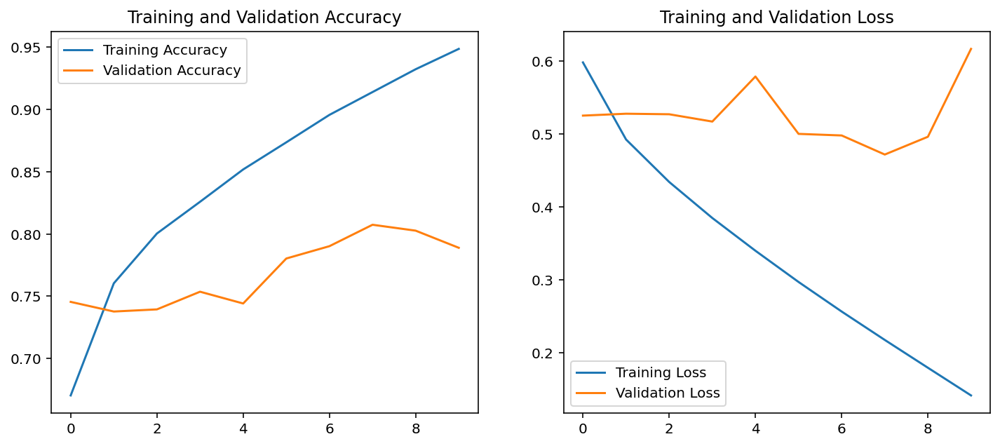

In [29]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

- 과적합(Overfitting, 오버피팅)이 발생했다. 모델의 성능이 제대로 올라가려면 "학습하지 않은" validation 데이터에 대해서도 성능이 좋아야 하는데, 훈련 데이터만으로 계속 학습하다 보니, train data에만 과도하게 적합(fitting) 되어서 일반화 능력이 떨어지게 되는 것

In [30]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[9.99962687e-01, 3.73392249e-05],
       [9.20885623e-01, 7.91143104e-02],
       [8.22378695e-01, 1.77621290e-01],
       [9.99975324e-01, 2.46699128e-05],
       [9.78978097e-01, 2.10218392e-02],
       [2.27178454e-01, 7.72821546e-01],
       [3.83632295e-02, 9.61636841e-01],
       [9.64722991e-01, 3.52770463e-02],
       [8.52779508e-01, 1.47220463e-01],
       [5.48912048e-01, 4.51087981e-01],
       [8.01822543e-01, 1.98177457e-01],
       [9.99972463e-01, 2.75811835e-05],
       [9.97293651e-01, 2.70629209e-03],
       [1.08460598e-01, 8.91539335e-01],
       [9.97638702e-01, 2.36133370e-03],
       [9.86368239e-01, 1.36317816e-02],
       [6.54426634e-01, 3.45573336e-01],
       [3.79588106e-04, 9.99620438e-01],
       [8.97945046e-01, 1.02054976e-01],
       [9.99339521e-01, 6.60443329e-04],
       [9.79669273e-01, 2.03307178e-02],
       [9.97990847e-01, 2.00911891e-03],
       [9.99966383e-01, 3.36345875e-05],
       [9.83994961e-01, 1.60051156e-02],
       [9.973365

In [33]:
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

- 모델이 판단한 [고양이일 확률, 강아지의 확률]인데, [1.0, 0.0]에 가까울수록 label이 0인 고양이로, [0.0, 1.0]에 가까울수록 label이 1인 강아지로 예측했다

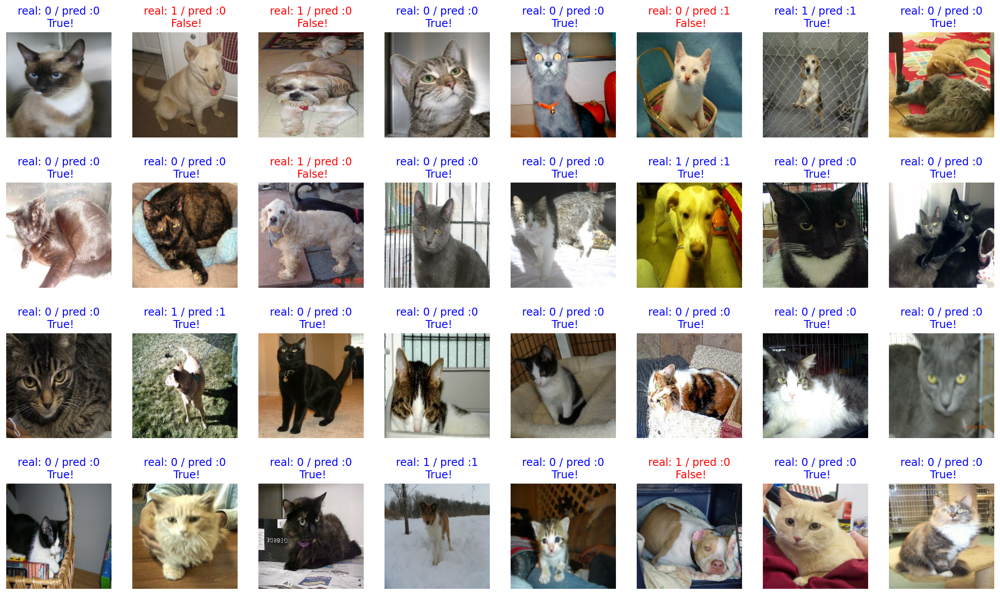

In [34]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [35]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count+1
print(count / 32 * 100)

84.375


---

# 5. 남의 모델 가져와서 쓰기
- 이미지 분류 대회인 ILSVRC와 데이터셋 ImageNet에서 단순한 모델로 사랑받은 VGG16
- https://neurohive.io/en/popular-networks/vgg16/
- 4개 레이어 : Conv(Convolutional layer), Pooling(MaxPooling layer), Dense(Fully connected layer), softmax layer
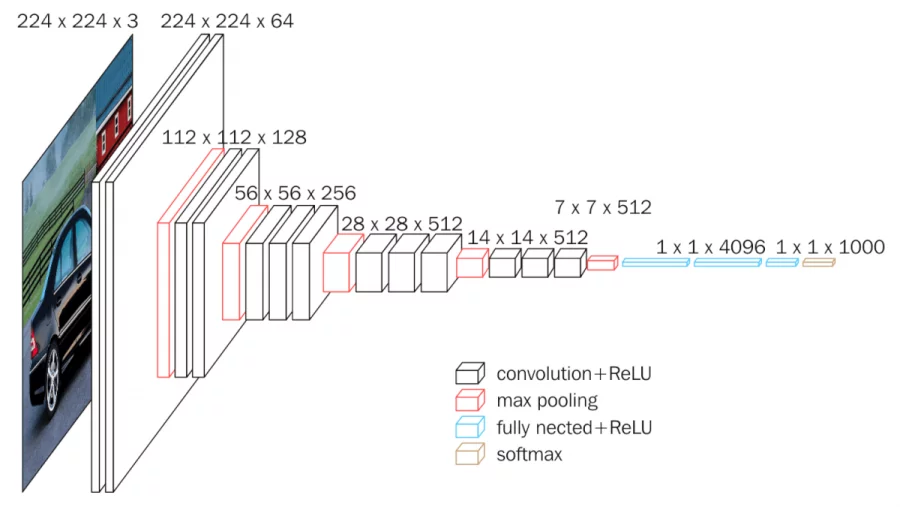

In [36]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58900480/58889256 [==============================] - 0s 0us/step


- 모델을 아주 간단히 가져올 수 있다

In [38]:
#우리가 학습할 때 사용할 데이터
image_batch.shape

TensorShape([32, 160, 160, 3])

In [39]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

- 이미지 사이즈가 160 -> 5 로 달라지고, 채널수는 3 -> 512로 달라졌다.

In [40]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

- 첫 번째 블록 : 2개의 Conv 레이어와 1개의 Pooling 레이어
- 두 번째 블록 : 2개의 Conv 레이어와 1개의 Pooling 레이어
- 세 번째 블록 : 3개의 Conv 레이어와 1개의 Pooling 레이어
- 네 번째 블록 : 3개의 Conv 레이어와 1개의 Pooling 레이어
- 다섯 번째 블록 : 3개의 Conv 레이어와 1개의 Pooling 레이어
- 여섯 번째 블록 : 3개의 Dense 레이어

## VGG16 끝단에 classifier 레이어를 붙여서 원하는 구조의 분류 모델 만들기 (GAP)

- Fully connected 레이어에 입력될 수 있는 벡터는 반드시 1차원이어야 합니다. 하지만, VGG16 끝단에 있는 벡터가 출력하는 건  (5, 5, 512)로 3차원이다. 이걸 1차원 벡터로 변환 (flatten) 해줘야 한다.

In [41]:
#GAP 만드는 layer 추가하기

global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print("슝~")

슝~


In [42]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [43]:
# dense layer에는 unit과 activation 2개의 매개변수만 사용해주세요.
# unit의 값은 위에서 global_average_layer를 통과했을 때의 값을 생각해보세요.
# 활성화 함수는 ReLU를 사용합니다.

dense_layer = tf.keras.layers.Dense(
    512,
    activation='relu',
    use_bias=True,
    kernel_initializer='glorot_uniform',
    bias_initializer='zeros'
)

# unit은 우리가 분류하고 싶은 class를 생각해보세요.
# 활성화 함수는 Softmax를 사용합니다.
prediction_layer = tf.keras.layers.Dense(
    2,
    activation='softmax',
    use_bias=True,
    kernel_initializer='glorot_uniform',
    bias_initializer='zeros'
)

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [44]:
#VGG16에 해당하는 base_model은 학습을 시키지 않을 예정이니 학습 여부를 결정하는 trainable 변수를 False로 지정해 "꺼주겠"습니다.
base_model.trainable = False
print("슝~")

슝~


In [45]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
print("슝~")

슝~


In [46]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


## 모델 compile

In [47]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [49]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 6/20 [========>.....................] - ETA: 0s - loss: 0.7308 - accuracy: 0.4062

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


18/20 [==========================>...] - ETA: 0s - loss: 0.7291 - accuracy: 0.4340

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


20/20 [==============================] - 1s 63ms/step - loss: 0.7290 - accuracy: 0.4250
initial loss: 0.73
initial accuracy: 0.43


In [50]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.
history = model.fit(train_batches, epochs=EPOCHS, validation_data=validation_batches)

Epoch 1/5
166/582 [=======>......................] - ETA: 51s - loss: 0.4050 - accuracy: 0.8509

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 47s - loss: 0.3810 - accuracy: 0.8602

209/582 [=========>....................] - ETA: 46s - loss: 0.3759 - accuracy: 0.8618

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 37s - loss: 0.3386 - accuracy: 0.8754

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


489/582 [========================>.....] - ETA: 11s - loss: 0.2794 - accuracy: 0.8958

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 10s - loss: 0.2763 - accuracy: 0.8967

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 8s - loss: 0.2739 - accuracy: 0.8974

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 5s - loss: 0.2685 - accuracy: 0.8993

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 4s - loss: 0.2672 - accuracy: 0.8997

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.2618 - accuracy: 0.9012

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 96s 160ms/step - loss: 0.2618 - accuracy: 0.9012 - val_loss: 0.1820 - val_accuracy: 0.9239
Epoch 2/5
166/582 [=======>......................] - ETA: 54s - loss: 0.1665 - accuracy: 0.9339

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 50s - loss: 0.1648 - accuracy: 0.9350

209/582 [=========>....................] - ETA: 48s - loss: 0.1658 - accuracy: 0.9344

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 39s - loss: 0.1664 - accuracy: 0.9346

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


489/582 [========================>.....] - ETA: 12s - loss: 0.1634 - accuracy: 0.9353

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 10s - loss: 0.1629 - accuracy: 0.9353

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 9s - loss: 0.1619 - accuracy: 0.9356

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 5s - loss: 0.1612 - accuracy: 0.9359

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 4s - loss: 0.1612 - accuracy: 0.9360

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1604 - accuracy: 0.9364

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 88s 147ms/step - loss: 0.1604 - accuracy: 0.9364 - val_loss: 0.1566 - val_accuracy: 0.9355
Epoch 3/5
166/582 [=======>......................] - ETA: 56s - loss: 0.1445 - accuracy: 0.9415

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 51s - loss: 0.1449 - accuracy: 0.9406

209/582 [=========>....................] - ETA: 49s - loss: 0.1453 - accuracy: 0.9403

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 40s - loss: 0.1493 - accuracy: 0.9374

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 12s - loss: 0.1472 - accuracy: 0.9395

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 10s - loss: 0.1468 - accuracy: 0.9396

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 9s - loss: 0.1467 - accuracy: 0.9395

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 5s - loss: 0.1457 - accuracy: 0.9401

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 4s - loss: 0.1455 - accuracy: 0.9402

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1455 - accuracy: 0.9403

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 88s 148ms/step - loss: 0.1455 - accuracy: 0.9403 - val_loss: 0.1466 - val_accuracy: 0.9351
Epoch 4/5
165/582 [=======>......................] - ETA: 54s - loss: 0.1402 - accuracy: 0.9407

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


198/582 [=========>....................] - ETA: 50s - loss: 0.1409 - accuracy: 0.9416

208/582 [=========>....................] - ETA: 48s - loss: 0.1394 - accuracy: 0.9425

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


280/582 [=============>................] - ETA: 39s - loss: 0.1416 - accuracy: 0.9413

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


488/582 [========================>.....] - ETA: 12s - loss: 0.1399 - accuracy: 0.9420

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


501/582 [========================>.....] - ETA: 10s - loss: 0.1408 - accuracy: 0.9419

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


512/582 [=========================>....] - ETA: 9s - loss: 0.1401 - accuracy: 0.9420

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 5s - loss: 0.1400 - accuracy: 0.9422

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 4s - loss: 0.1397 - accuracy: 0.9424

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1392 - accuracy: 0.9430

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 88s 148ms/step - loss: 0.1392 - accuracy: 0.9430 - val_loss: 0.1419 - val_accuracy: 0.9402
Epoch 5/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1329 - accuracy: 0.9431

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.1328 - accuracy: 0.9442

210/582 [=========>....................] - ETA: 29s - loss: 0.1328 - accuracy: 0.9442

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1339 - accuracy: 0.9440

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1346 - accuracy: 0.9442

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1340 - accuracy: 0.9444

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1348 - accuracy: 0.9442

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1338 - accuracy: 0.9448

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1339 - accuracy: 0.9448

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1342 - accuracy: 0.9449

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 52s 88ms/step - loss: 0.1342 - accuracy: 0.9449 - val_loss: 0.1425 - val_accuracy: 0.9377


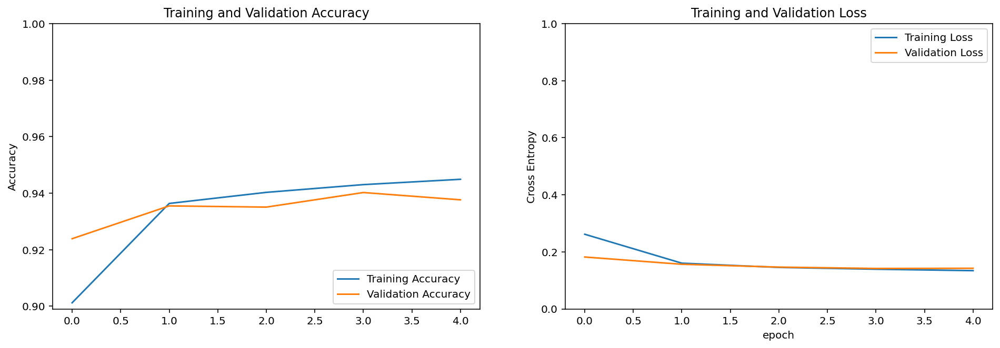

In [56]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

- 학습이 매우 정확도가 높다는 걸 알게 됐다. 역시 학습 잘 된 모델을 가져와서 쓰는 게 최고다.

In [52]:
# 32개 test sample에 대한 예측 결과를 확인해본다
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.99994278e-01, 5.70118391e-06],
       [1.73231274e-01, 8.26768756e-01],
       [4.41211671e-01, 5.58788300e-01],
       [9.99997854e-01, 2.14434294e-06],
       [9.98968363e-01, 1.03163323e-03],
       [9.93741095e-01, 6.25884486e-03],
       [2.54330691e-04, 9.99745667e-01],
       [7.34898746e-01, 2.65101284e-01],
       [9.70180333e-01, 2.98197232e-02],
       [9.73196030e-01, 2.68039759e-02],
       [8.28625998e-05, 9.99917150e-01],
       [9.99969244e-01, 3.07020455e-05],
       [9.93668616e-01, 6.33138698e-03],
       [4.85586179e-06, 9.99995112e-01],
       [9.99061763e-01, 9.38306912e-04],
       [9.91614580e-01, 8.38548783e-03],
       [9.97221947e-01, 2.77803862e-03],
       [4.15033996e-02, 9.58496630e-01],
       [7.13433385e-01, 2.86566585e-01],
       [9.97021019e-01, 2.97890743e-03],
       [9.51781273e-01, 4.82187644e-02],
       [9.89678144e-01, 1.03218080e-02],
       [9.96545374e-01, 3.45459697e-03],
       [9.83991802e-01, 1.60082020e-02],
       [9.991117

In [53]:
# 고양이:0, 강아지:1 로  실제 추론한 라벨로 prediction값을 변환한다
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

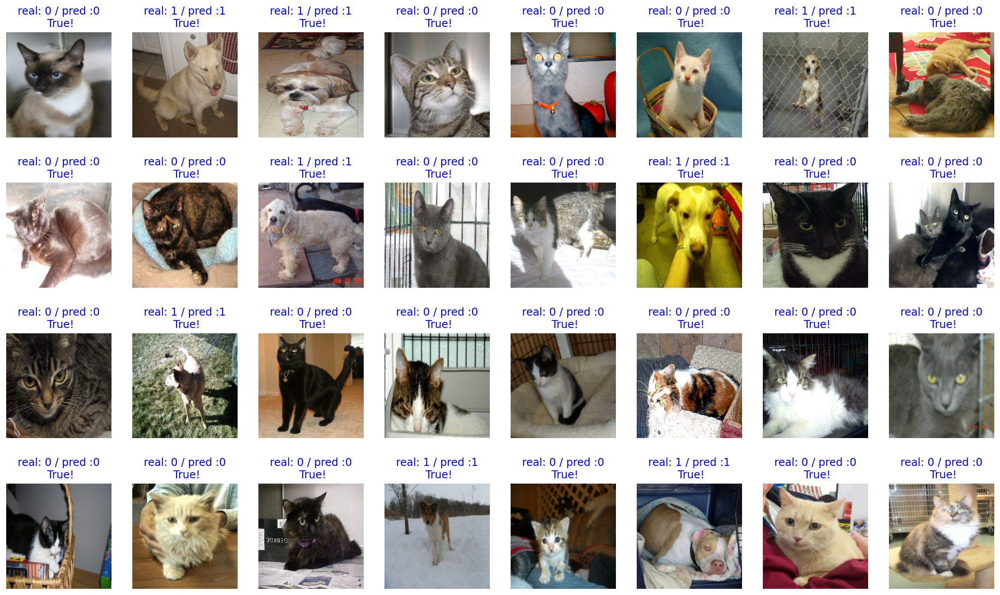

In [54]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [55]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

100.0


- 정확도가 100%다. 모델 정확도도 93% 수준으로 매우 높았다.

## 모델 save하고 load하기

In [57]:
!mkdir -p ~/aiffel/cat_vs_dog/checkpoint
!mkdir -p ~/aiffel/cat_vs_dog/images

In [58]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


- save_weights 함수로 모델을 save할 수 있다

## 이 모델을 가져다써서 다른 이미지 예측해보기

In [59]:
!ln -s ~/data/* ~/aiffel/cat_vs_dog/images/

In [60]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

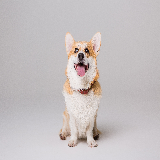

In [61]:
IMG_SIZE = 160
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

- 모델이 (160, 160)사이즈만 입력받을 수 있으므로, 파라미터에 이미지 사이즈를 넣어줘야 한다

In [62]:
#모델에 넣을 수 있도록 이미지를 array, 즉 배열 자료형으로 변환해주겠습니다.
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [63]:
#고양이라면 [1.0, 0.0], 강아지라면 [0.0, 1.0]에 가까운 확률 분포가 예측
prediction = model.predict(dog_image)
prediction

array([[2.0901725e-13, 1.0000000e+00]], dtype=float32)

- 매우 확고하게 강아지가 1이다 ㅋㅋ

In [64]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 100% dog, and 0% cat.


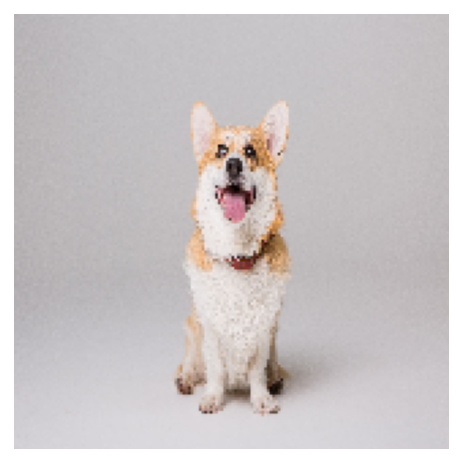

In [65]:
filename = 'my_dog.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


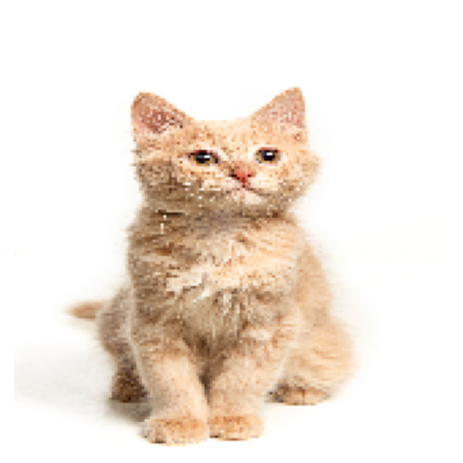

In [66]:
filename = 'my_cat.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


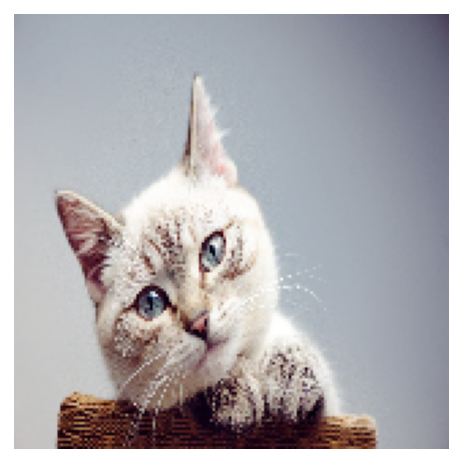

In [67]:
filename = "cat_face.jpg"
show_and_predict_image(img_dir_path, filename)